In [2]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql import functions as F
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql import Window
import pandas as pd



In [3]:
spark=SparkSession.builder\
.appName("IMDB Movie Analysis")\
.config("spark.driver.memory", "5g")\
.config("spark.executor.memory", "5g")\
.getOrCreate()

spark

In [4]:
path=r"..\files"

name_basics=spark.read.csv(f"{path}\cleaned_name_basics.csv",header=True)
reviews=spark.read.csv(f"{path}\cleaned_reviews4.csv",header=True)
title_akas=spark.read.csv(f"{path}\cleaned_title_akas.csv",header=True)
title_crew=spark.read.csv(f"{path}\cleaned_title_crew.csv",header=True)
title_episode=spark.read.csv(f"{path}\cleaned_title_episode.csv",header=True)
title_principals=spark.read.csv(f"{path}\cleaned_title_principals.csv",header=True)
title_rating=spark.read.csv(f"{path}\cleaned_title_ratings.csv",header=True)
title_basics=spark.read.csv(f"{path}\cleaned_title.basics.csv",header=True)


In [4]:
df_genres = title_basics.withColumn("genres", explode(split(col("genres"), ",")))  # Split genres array
genre_count = df_genres.groupBy("genres").agg(count("*").alias("count")).orderBy(col("count").desc())
genre_count.show()

+-----------+-------+
|     genres|  count|
+-----------+-------+
|      Drama|2603617|
|     Comedy|1905927|
|  Talk-Show|1174757|
|      Short|1148610|
|Documentary|1007063|
|       News| 951240|
|    Romance| 909769|
|     Family| 688728|
| Reality-TV| 554819|
|  Animation| 480167|
|     Action| 415396|
|      Crime| 415072|
|    Unknown| 413058|
|  Game-Show| 384448|
|  Adventure| 384171|
|      Music| 366345|
|      Adult| 351398|
|      Sport| 261503|
|    Fantasy| 207481|
|    Mystery| 206196|
+-----------+-------+
only showing top 20 rows



In [5]:
df_movies_run_time = (title_basics.join(title_rating, "tconst")
                      .filter((col("titleType") == "movie") & (col("numVotes").cast("int") > 5000))
                      .select("primaryTitle", "genres", "averageRating", "numVotes", "runtimeMinutes")
                      .orderBy(col("averageRating").desc()))

df_movies_run_time.show()

+--------------------+--------------------+-------------+--------+--------------+
|        primaryTitle|              genres|averageRating|numVotes|runtimeMinutes|
+--------------------+--------------------+-------------+--------+--------------+
|The Shawshank Red...|               Drama|          9.3| 2947931|           142|
|The Silence of Sw...| Documentary,History|          9.2|   10561|            56|
|Ramayana: The Leg...|Action,Adventure,...|          9.2|   15360|           135|
|     The Chaos Class|              Comedy|          9.2|   43542|            87|
|       The Godfather|         Crime,Drama|          9.2| 2054777|           175|
|           Mayabazar|        Comedy,Drama|          9.1|    5982|           192|
|         The Unnamed|               Drama|          9.0|    5886|           100|
|    Schindler's List|Biography,Drama,H...|          9.0| 1478781|           195|
|               Kaiva|Action,Drama,Romance|          9.0|   68902|           138|
|The Lord of the

In [7]:
df_liked_genres_stats = (
    title_basics.join(title_rating, "tconst")
    .filter((col("titleType") == "movie") & (col("numVotes").cast("int") > 5000) & (col("averageRating") >= 7.0) & ((col("runtimeMinutes").cast("int")) <= 243)) 
    .withColumn("genre", F.explode(F.split(col("genres"), ",")))  
    .groupBy("genre") 
    .agg(
        F.sum(col("runtimeMinutes").cast("int")).alias("total_runtime_minutes"),  # Sum of runtimeMinutes
        F.avg(col("averageRating")).alias("average_rating"),  # Average rating, no need to cast to int for ratings
        F.avg(col("runtimeMinutes").cast("int")).alias("average_runtime_minutes"),  # Average runtimeMinutes
        F.count("*").alias("num_movies")  # Count of movies
    )
    .filter(col("num_movies") > 20)
    .orderBy(col("average_rating").desc())  
)

df_liked_genres_stats.show(50)


+-----------+---------------------+------------------+-----------------------+----------+
|      genre|total_runtime_minutes|    average_rating|average_runtime_minutes|num_movies|
+-----------+---------------------+------------------+-----------------------+----------+
|Documentary|                43947|  7.67270642201835|     100.79587155963303|       436|
|        War|                32481| 7.615413533834584|     122.10902255639098|       266|
|     Family|                26402| 7.544628099173555|     109.09917355371901|       242|
|      Music|                28900| 7.535156250000003|             112.890625|       256|
|  Animation|                33165| 7.526666666666666|       96.1304347826087|       345|
|    Musical|                14845|  7.52300884955752|      131.3716814159292|       113|
|      Sport|                18948|7.5106250000000045|                118.425|       160|
|    History|                50908| 7.507960199004977|       126.636815920398|       402|
|      Dra

In [8]:
df_pd=df_liked_genres_stats.toPandas()




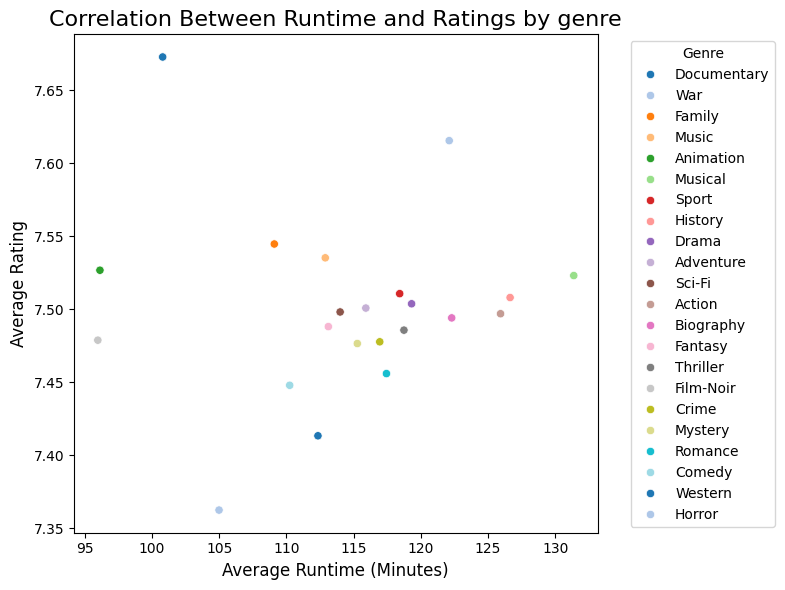

In [9]:
# Correlation analysis: Runtime vs. Rating
plt.figure(figsize=(8, 6))
palette = sns.color_palette("tab20", n_colors=df_pd['genre'].nunique())
sns.scatterplot(x="average_runtime_minutes", y="average_rating",hue="genre", data=df_pd, palette=palette)
plt.title("Correlation Between Runtime and Ratings by genre",fontsize=16)
plt.xlabel("Average Runtime (Minutes)",fontsize=12)
plt.ylabel("Average Rating",fontsize=12)
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Max # of Directors a movie can have ,yet people would still like**

In [10]:
# Explode directors and count how many directors worked on a movie
df_directors = title_crew.withColumn("director_count", F.size(F.split(col("directors"), ",")))

In [11]:
# Join with ratings to analyze the impact of multiple directors
df_director_ratings = df_directors.join(title_basics, "tconst").join(title_rating, "tconst")
df_director_ratings_filtered = df_director_ratings.filter(
    (col("titleType") == "movie") & 
    (col("averageRating") >= 7.0) & 
    (col("numVotes") > 5000) &
    (~F.col("genres").like("%Animation%"))
).orderBy(col("director_count").desc())


df_director_ratings_filtered.show()


+---------+--------------------+--------------------+--------------+---------+--------------------+--------------------+-------+---------+-------+--------------+--------------------+-------------+--------+
|   tconst|           directors|             writers|director_count|titleType|        primaryTitle|       originalTitle|isAdult|startYear|endYear|runtimeMinutes|              genres|averageRating|numVotes|
+---------+--------------------+--------------------+--------------+---------+--------------------+--------------------+-------+---------+-------+--------------+--------------------+-------------+--------+
|tt1687247|nm9546825,nm33880...|                  \N|            35|    movie|       Life in a Day|       Life in a Day|      0|     2011|     -1|            95|   Documentary,Drama|          7.6|   15619|
|tt0401711|nm0000801,nm00414...|nm0138894,nm06879...|            21|    movie|   Paris, I Love You|    Paris, je t'aime|      0|     2006|     -1|           120|Comedy,Drama,Ro

In [12]:
# Group by director count and calculate average rating
top_df_director_ratings=df_director_ratings_filtered.groupBy(col("director_count")).agg(
    F.count("*").alias("number_of_movies"),
    F.avg("averageRating").alias("avg_rating"),
     F.collect_list("tconst").alias("tconst_list") 
).filter(col("number_of_movies")>10).orderBy(col("avg_rating").desc()).select("director_count","avg_rating","number_of_movies","tconst_list")


In [13]:
#-> Insight is people like it when a movie has 1,2,3 directors ,with 3 directors being the best choice with a 0.06 difference from 2 directors and 0.1 difference from having 1 director and then ratings start to drop with 4 directors
top_df_director_ratings.show()

+--------------+------------------+----------------+--------------------+
|director_count|        avg_rating|number_of_movies|         tconst_list|
+--------------+------------------+----------------+--------------------+
|             3| 7.597500000000001|              40|[tt0031381, tt030...|
|             2| 7.539759036144574|             332|[tt0018217, tt002...|
|             1|7.4982846140380754|            5713|[tt0009968, tt001...|
|             4| 7.361538461538463|              13|[tt0055805, tt007...|
+--------------+------------------+----------------+--------------------+



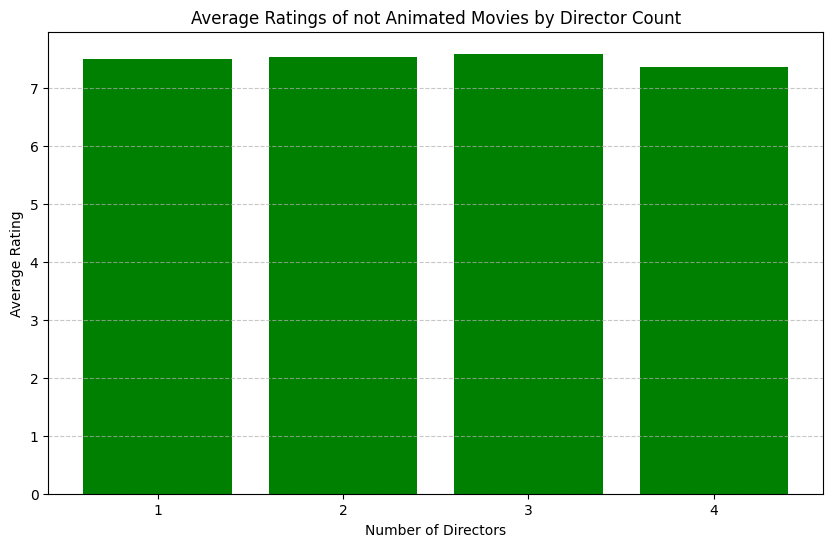

In [14]:
top_df_director_ratings_pd = top_df_director_ratings.toPandas()

# Plotting
plt.figure(figsize=(10, 6))

# Bar plot for average ratings by director count
plt.bar(top_df_director_ratings_pd["director_count"], top_df_director_ratings_pd["avg_rating"], color='green')

# Adding labels and title
plt.xlabel("Number of Directors")
plt.ylabel("Average Rating")
plt.title("Average Ratings of not Animated Movies by Director Count")

# Show plot
plt.xticks(top_df_director_ratings_pd["director_count"])  
plt.grid(axis='y', linestyle='--', alpha=0.7)  

# Show plot
plt.show()

# 3 2 1 4 

**Animation genre directors ,and best number of directors in an animation movie**

In [16]:
df_director_ratings_for_animation = df_directors.join(title_basics, "tconst").join(title_rating, "tconst").filter((col("titleType") == "movie") & (col("numVotes")>5000)).orderBy(col("director_count").desc())




In [17]:
# Filter for animated movies
df_animated = df_director_ratings_for_animation.filter(F.col("genres").like("%Animation%"))

# Filter for non-animated movies
df_non_animated = df_director_ratings_for_animation.filter(~F.col("genres").like("%Animation%"))

# Group and count for animated movies
df_animated_grouped = df_animated.groupBy("director_count").agg(
    F.count("*").alias("number_of_movies")
).orderBy("director_count")

# Group and count for non-animated movies and filter for director count less than 20
df_non_animated_grouped = df_non_animated.groupBy("director_count").agg(
    F.count("*").alias("number_of_movies")
).filter(col("director_count") < 20).orderBy("director_count")



In [18]:
df_animated.show()

+---------+--------------------+--------------------+--------------+---------+--------------------+--------------------+-------+---------+-------+--------------+--------------------+-------------+--------+
|   tconst|           directors|             writers|director_count|titleType|        primaryTitle|       originalTitle|isAdult|startYear|endYear|runtimeMinutes|              genres|averageRating|numVotes|
+---------+--------------------+--------------------+--------------+---------+--------------------+--------------------+-------+---------+-------+--------------+--------------------+-------------+--------+
|tt0169880|nm0030417,nm15357...|nm0030417,nm07663...|            15|    movie|Neon Genesis Evan...|Shin seiki Evange...|      0|     1997|     -1|           101|Action,Animation,...|          7.2|   15932|
|tt0032455|nm0019282,nm00358...|nm0335469,nm04000...|            12|    movie|            Fantasia|            Fantasia|      0|     1940|     -1|           124|Animation,Famil

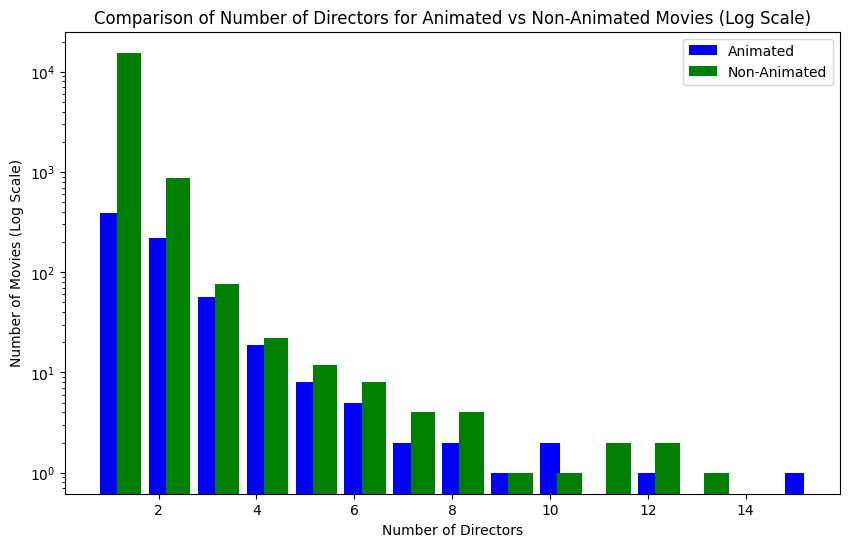

In [19]:
# Convert to Pandas for plotting
animated_pd = df_animated_grouped.toPandas()
non_animated_pd = df_non_animated_grouped.toPandas()

# Plot the data
plt.figure(figsize=(10, 6))

# Plot for animated movies
plt.bar(animated_pd["director_count"], animated_pd["number_of_movies"], 
        color='blue', width=0.4, label='Animated', align='center')

# Plot for non-animated movies
plt.bar(non_animated_pd["director_count"] + 0.4, non_animated_pd["number_of_movies"], 
        color='green', width=0.5, label='Non-Animated', align='center')

# Log scale on the y-axis
plt.yscale('log')

# Adding labels and title
plt.xlabel("Number of Directors")
plt.ylabel("Number of Movies (Log Scale)")
plt.title("Comparison of Number of Directors for Animated vs Non-Animated Movies (Log Scale)")
plt.legend()

# Show plot
plt.show()

In [20]:
animated_director_ratings = df_animated.groupBy("director_count").agg(
    F.count("*").alias("number_of_movies"),
    F.avg("averageRating").alias("avg_rating")
    ).filter(col("number_of_movies")>2).orderBy("avg_rating",ascending=False)

animated_director_ratings.show()


+--------------+----------------+-----------------+
|director_count|number_of_movies|       avg_rating|
+--------------+----------------+-----------------+
|             6|               5|              7.6|
|             1|             392| 6.81887755102041|
|             5|               8|           6.8125|
|             3|              57|6.787719298245612|
|             2|             218|6.774311926605502|
|             4|              19|6.584210526315789|
+--------------+----------------+-----------------+



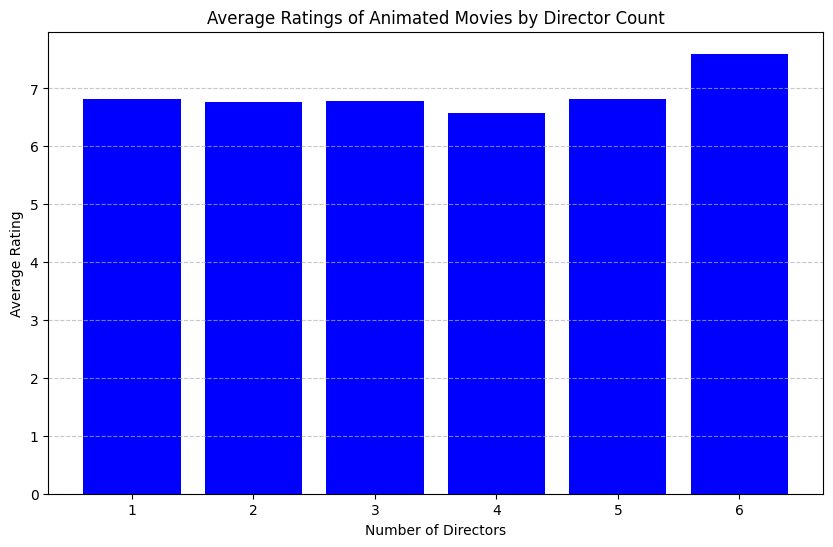

In [21]:
animated_director_ratings_pd = animated_director_ratings.toPandas()

# Plotting
plt.figure(figsize=(10, 6))

# Bar plot for average ratings by director count
plt.bar(animated_director_ratings_pd["director_count"], animated_director_ratings_pd["avg_rating"], color='blue')

# Adding labels and title
plt.xlabel("Number of Directors")
plt.ylabel("Average Rating")
plt.title("Average Ratings of Animated Movies by Director Count")

# Show plot
plt.xticks(animated_director_ratings_pd["director_count"])  
plt.grid(axis='y', linestyle='--', alpha=0.7)  

# Show plot
plt.show()

#6 1 5 3 2 4


**Most Liked Genre Combinations**

In [16]:
# Filter only movies and join the ratings with title_basics
df_movies = (
    title_basics.join(title_rating, "tconst")
    .filter((col("titleType") == "movie") & (col("numVotes") > 5000))
    .select("tconst", "primaryTitle", "runtimeMinutes", "genres", "averageRating")
)

# Explode genres to get one genre per row
df_exploded = df_movies.withColumn("genre", F.explode(F.split(F.col("genres"), ",")))

In [17]:
# most liked genre combinations 
df_genre = df_movies.select("tconst","genres")


# Flatten pairs and calculate average ratings for each pair
df_pairs_ratings = df_genre.join(title_rating, "tconst")


df_genre_ratings =df_pairs_ratings.groupBy("genres").agg(
    F.avg("averageRating").alias("avg_rating"),
    F.count("*").alias("number_of_movies"),
    F.collect_list("tconst").alias("Movie_ID's")
).filter(col("number_of_movies")>1).orderBy("avg_rating", ascending=False)

In [14]:
df_genre_ratings.show(50)

+--------------------+------------------+----------------+--------------------+
|              genres|        avg_rating|number_of_movies|          Movie_ID's|
+--------------------+------------------+----------------+--------------------+
|       Drama,Musical| 8.366666666666665|               3|[tt1754109, tt036...|
|   Drama,Mystery,War| 8.350000000000001|               2|[tt1255953, tt007...|
|Documentary,Histo...| 8.166666666666666|               6|[tt4908644, tt230...|
|   Drama,Fantasy,War| 8.149999999999999|               2|[tt0457430, tt004...|
| Animation,Drama,War|               8.1|               2|[tt0095327, tt009...|
|Documentary,Music...|               8.1|               2|[tt28814949, tt11...|
|Comedy,Horror,Mys...|              8.05|               2|[tt0214915, tt099...|
|     Documentary,War| 7.942857142857143|               7|[tt2125423, tt835...|
|    Adventure,Sci-Fi| 7.933333333333334|               3|[tt0063442, tt006...|
|Animation,Biograp...| 7.933333333333334

In [18]:
df_genre_ratings.toPandas().to_csv("df_pairs_ratings2.csv")

In [42]:
# Join release year with ratings
df_ratings_year = title_basics.join(title_rating, "tconst").select("startYear", "averageRating", "genres")

# Explode genres
df_genres_year = df_ratings_year.withColumn("genre", F.explode(F.split(F.col("genres"), ","))).filter(col("genre")!="unknown")

# Group by year and genre to find trends
df_trends = df_genres_year.groupBy("startYear", "genre").agg(F.avg("averageRating").alias("avg_rating"))




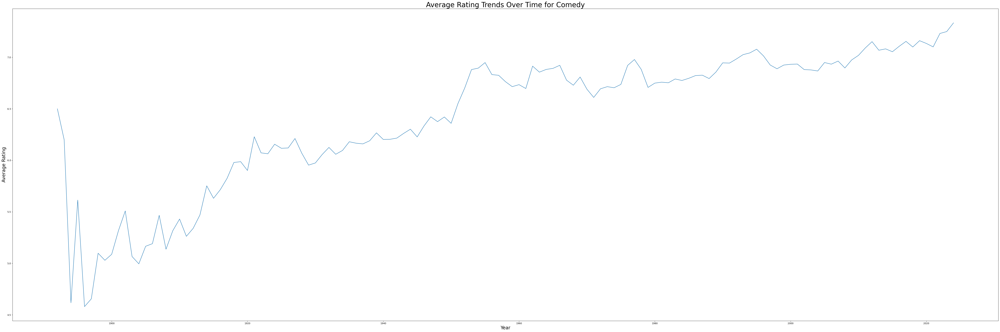

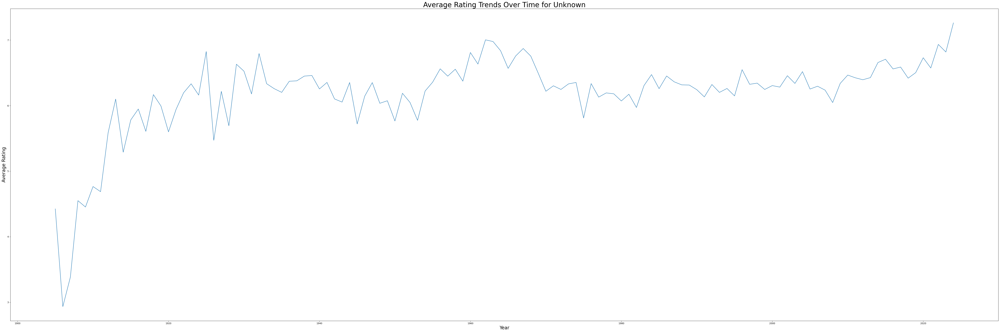

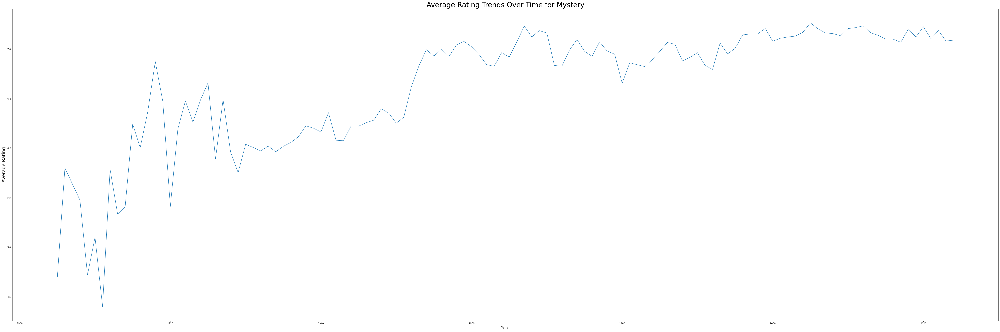

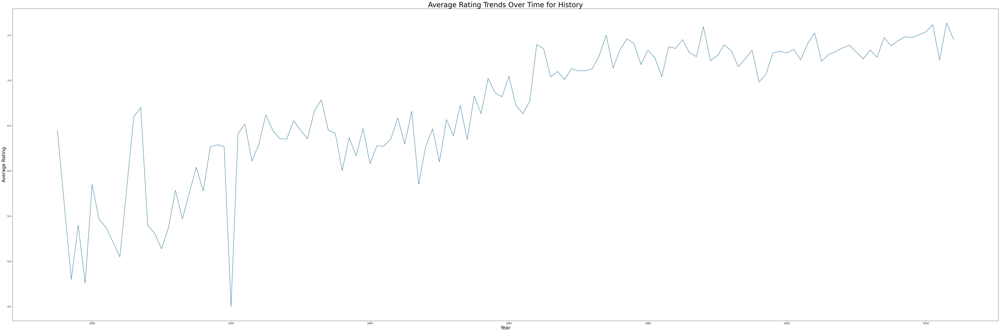

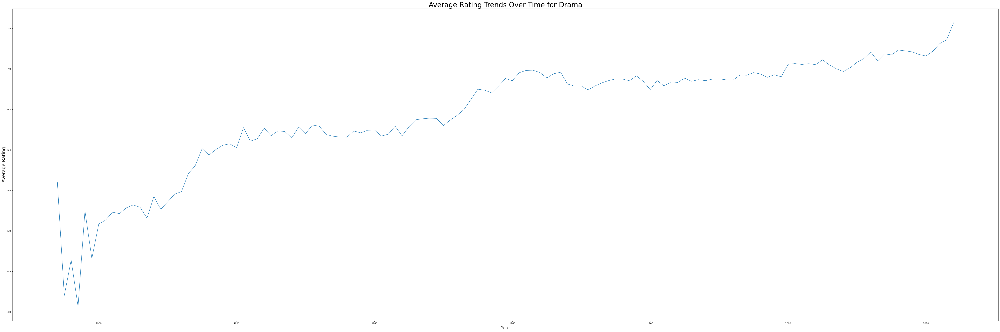

...

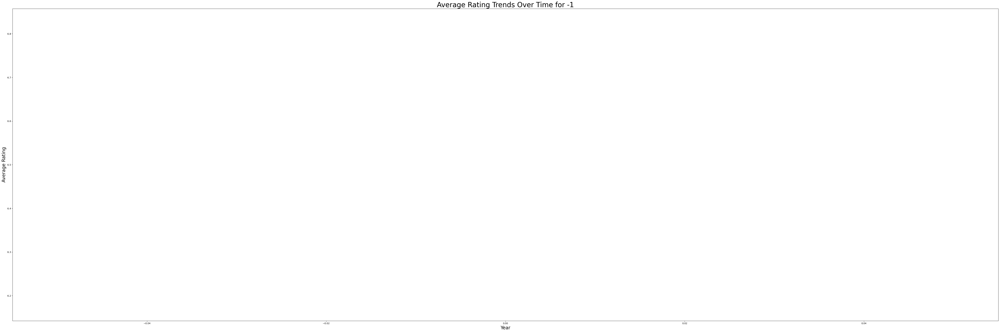

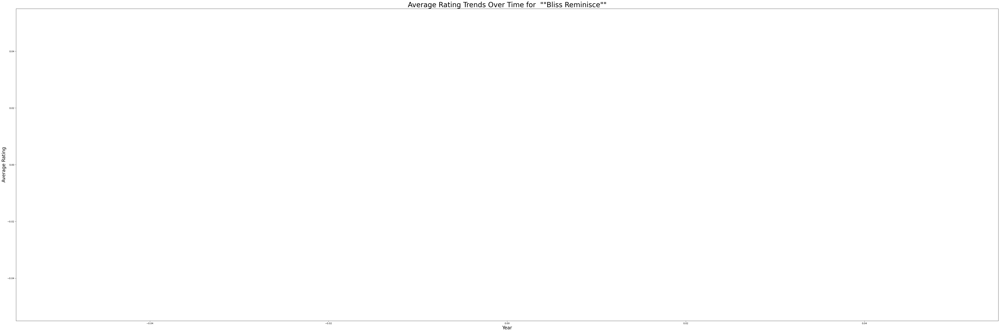

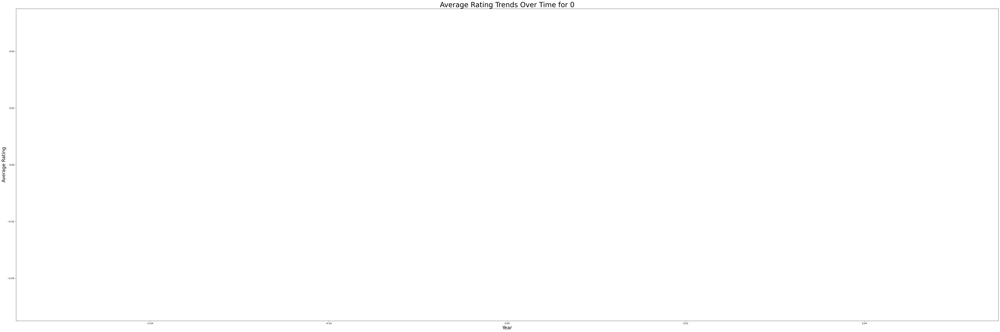

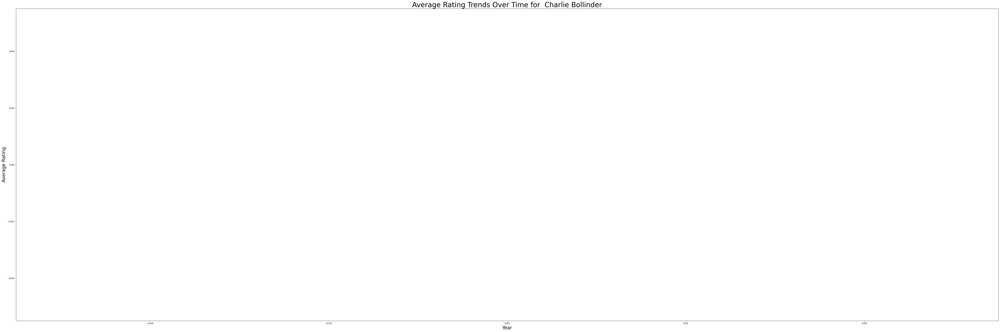

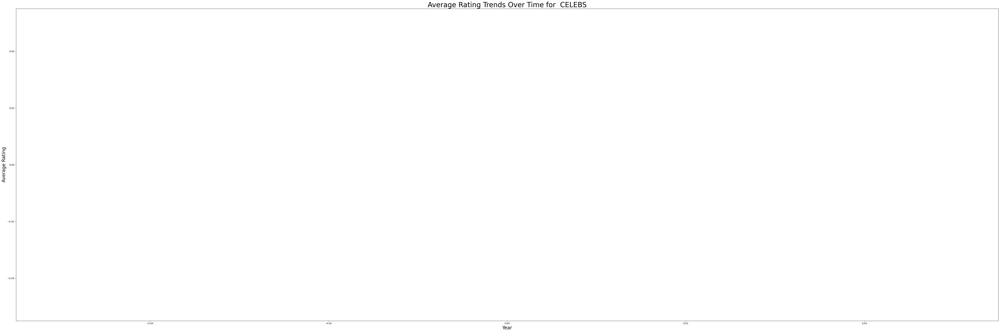

In [43]:
df_trends = df_trends.filter(col("startYear") != r"\N").withColumn("startYear", col("startYear").cast("int"))


# Visualize trends over time for top genres
df_trends_pd = df_trends.toPandas()
# Get unique genres from the dataframe
unique_genres = df_trends_pd["genre"].unique()

# Iterate over each genre and plot individually

for genre in unique_genres:
    genre_data = df_trends_pd[df_trends_pd["genre"] == genre]
    plt.figure(figsize=(60, 20))
    sns.lineplot(x="startYear", y="avg_rating", data=genre_data)
    plt.title(f"Average Rating Trends Over Time for {genre}", fontsize=30)
    plt.xlabel("Year", fontsize=20)
    plt.ylabel("Average Rating", fontsize=20)
    plt.tight_layout()
    plt.show()



**Do you want to work with a director?**

In [63]:
#Do you want to work with a certain director?
#.filter((col("titleType") == "movie") & (col("numVotes").cast("int") > 5000) & (col("averageRating") >= 7.0) & ((col("runtimeMinutes").cast("int")) <= 243)) 
df_directors_exploded = title_crew.withColumn("director", explode(split(col("directors"), ",")))

df_director_ratings = df_directors_exploded.join(title_rating, "tconst") \
    .join(name_basics, df_directors_exploded.director == name_basics.nconst) \
    .join(title_basics, "tconst")\
    .filter((col("titleType") == "movie") & (col("numVotes").cast("int") > 5000) & (col("averageRating") >= 7.0) & (col("nconst") !=r"\N")& ((col("deathYear")).cast("int")>= 2000))\
    .select("director", "averageRating", "primaryName")

df_director_avg_rating = df_director_ratings.groupBy("primaryName").agg(avg("averageRating").alias("avg_rating")) \
    .orderBy(col("avg_rating").desc())

df_director_avg_rating.show()


+--------------------+-----------------+
|         primaryName|       avg_rating|
+--------------------+-----------------+
|Bozidar 'Bota' Ni...|              8.8|
|     Claude Lanzmann|              8.7|
|      Irvin Kershner|              8.7|
|         Orhan Aksoy|              8.7|
|           I.V. Sasi|              8.7|
|         Péter Bacsó|              8.6|
|   Sergiu Nicolaescu|              8.5|
|         Elem Klimov|              8.4|
|         Ergin Orbey|              8.4|
|         Ivo Caprino|              8.4|
|     Moustapha Akkad|8.399999999999999|
|          Zeki Ökten|8.333333333333334|
|      Jonathan Demme|8.333333333333334|
|       Attila Dargay|              8.3|
|        Tunç Basaran|              8.3|
|Hrishikesh Mukherjee|              8.3|
|         Vijay Anand|              8.3|
| Hiroshi Teshigahara|              8.2|
|   Malik Bendjelloul|              8.2|
|   Grigoriy Chukhray|              8.2|
+--------------------+-----------------+
only showing top

In [64]:
#Do you want to work with a certain director?
df_directors_exploded = title_crew.withColumn("director", explode(split(col("directors"), ",")))

df_director_ratings_series = df_directors_exploded.join(title_rating, "tconst") \
    .join(name_basics, df_directors_exploded.director == name_basics.nconst) \
    .join(title_basics, "tconst")\
    .filter((col("titleType") == "tvseries") & (col("numVotes").cast("int") > 5000) & (col("averageRating") >= 7.0) & (col("nconst") !=r"\N")& ((col("deathYear")).cast("int")>= 2000))\
    .select("director", "averageRating", "primaryName")

df_director_avg_rating_series = df_director_ratings.groupBy("primaryName").agg(avg("averageRating").alias("avg_rating")) \
    .orderBy(col("avg_rating").desc())

df_director_avg_rating_series.show()

+--------------------+-----------------+
|         primaryName|       avg_rating|
+--------------------+-----------------+
|Bozidar 'Bota' Ni...|              8.8|
|     Claude Lanzmann|              8.7|
|      Irvin Kershner|              8.7|
|         Orhan Aksoy|              8.7|
|           I.V. Sasi|              8.7|
|         Péter Bacsó|              8.6|
|   Sergiu Nicolaescu|              8.5|
|         Elem Klimov|              8.4|
|         Ergin Orbey|              8.4|
|         Ivo Caprino|              8.4|
|     Moustapha Akkad|8.399999999999999|
|          Zeki Ökten|8.333333333333334|
|      Jonathan Demme|8.333333333333334|
|       Attila Dargay|              8.3|
|        Tunç Basaran|              8.3|
|Hrishikesh Mukherjee|              8.3|
|         Vijay Anand|              8.3|
| Hiroshi Teshigahara|              8.2|
|   Malik Bendjelloul|              8.2|
|   Grigoriy Chukhray|              8.2|
+--------------------+-----------------+
only showing top

In [ ]:

# Visualization: Top directors for movie
df_director_avg_rating_pd = df_director_avg_rating.toPandas()
plt.figure(figsize=(10, 6))
sns.barplot(x="primaryName", y="avg_rating", data=df_director_avg_rating_pd.head(20), palette="viridis")
plt.xticks(rotation=90)
plt.title("Top 20 Directors by Average Rating for Movies")
plt.tight_layout()
plt.show()

In [66]:
df_writers = title_crew.withColumn("writer_count", F.size(F.split(col("writers"), ",")))

# Join with title_basics to get the genres (specifically focusing on animated movies)
df_writers_with_genres = df_writers.join(title_basics, "tconst")\
    .filter((col("titleType") == "movie"))

# Filter for animated movies and non-animated movies
df_animated_writers = df_writers_with_genres.filter(col("genres").like("%Animation%"))
df_non_animated_writers = df_writers_with_genres.filter(~col("genres").like("%Animation%"))

# Join with title_ratings to get rating data for both animated and non-animated
df_animated_writers_ratings = df_animated_writers.join(title_rating, "tconst").filter(col("numVotes").cast("int") > 5000)
df_non_animated_writers_ratings = df_non_animated_writers.join(title_rating, "tconst").filter(col("numVotes").cast("int") > 5000)

# Group by writer count, calculate number of movies, and average rating for animated movies
df_animated_writer_stats = df_animated_writers_ratings.groupBy("writer_count").agg(
    F.count("*").alias("number_of_movies"),
    F.avg("averageRating").alias("avg_rating")
).filter(col("number_of_movies") > 10).orderBy("avg_rating", ascending=False)

# Same thing for non-animated movies
df_non_animated_writer_stats = df_non_animated_writers_ratings.groupBy("writer_count").agg(
    F.count("*").alias("number_of_movies"),
    F.avg("averageRating").alias("avg_rating")
).filter(col("number_of_movies") > 10).orderBy("avg_rating", ascending=False)




In [67]:
df_animated_writer_stats.show()



+------------+----------------+------------------+
|writer_count|number_of_movies|        avg_rating|
+------------+----------------+------------------+
|           1|              78|              7.25|
|           2|             160| 7.038124999999999|
|           8|              28|             6.825|
|           3|             147| 6.710204081632654|
|           6|              45|6.6822222222222205|
|           4|              86| 6.640697674418607|
|           7|              31| 6.554838709677419|
|           5|              63| 6.514285714285714|
|           9|              12| 6.508333333333333|
|          10|              21|6.4333333333333345|
+------------+----------------+------------------+



In [68]:

df_non_animated_writer_stats.show()


+------------+----------------+------------------+
|writer_count|number_of_movies|        avg_rating|
+------------+----------------+------------------+
|           9|              34|6.7941176470588225|
|          11|              13| 6.792307692307692|
|           7|             117| 6.735897435897435|
|          10|              20|             6.615|
|           6|             279| 6.563440860215053|
|           8|              63| 6.511111111111112|
|           1|            5479|   6.5070450812192|
|           3|            2982| 6.505298457411129|
|           5|             688| 6.503779069767441|
|           4|            1464| 6.502390710382514|
|           2|            5326| 6.473995493803978|
+------------+----------------+------------------+



In [69]:

animated_writer_stats_pd = df_animated_writer_stats.toPandas()
non_animated_writer_stats_pd = df_non_animated_writer_stats.toPandas()


**#1 Fan Region for genres**

In [71]:
# Join region and ratings
# Join title.akas with title.basics on tconst to get genres per region
df_region_genre = title_akas.join(title_basics, title_akas.titleId == title_basics.tconst, "inner").filter(
    (col("region") != "\\N") &  # Filter out unknown regions
    (col("genres") != "unknown") &  # Filter out unknown genres
    (col("titleType") == "movie")  # Only include movies
).select(
    "tconst", "region", "genres"  # Select the necessary columns
)

df_exploded_genres = df_region_genre.withColumn("genre", explode(split(col("genres"), ",")))

df_region_genre_ratings = df_exploded_genres.join(title_rating, "tconst").select(
    "region", "genre", "averageRating"
)

df_genre_popularity_by_region = df_region_genre_ratings.groupBy("region", "genre").agg(
    F.count("*").alias("number_of_movies"),
    F.avg("averageRating").alias("avg_rating")
).filter(col("number_of_movies") > 5)


# Step 2: Use a window function to rank the genres by average rating for each region
window = Window.partitionBy("region").orderBy(F.desc("avg_rating"))

# Add a rank column based on the window
df_ranked_genres = df_genre_popularity_by_region.withColumn("rank", F.rank().over(window))

# Step 3: Filter to keep only the top-ranked genre for each region
df_top_genre_per_region = df_ranked_genres.filter(col("rank") == 1)


In [72]:
df_top_genre_per_region.select("region", "genre", "avg_rating", "number_of_movies").show(50)


+------+-----------+------------------+----------------+
|region|      genre|        avg_rating|number_of_movies|
+------+-----------+------------------+----------------+
|    AE|  Biography| 6.978571428571429|             448|
|    AF|Documentary|              7.35|              16|
|    AL|        War|7.6305555555555555|              36|
|    AM|        War|               7.1|              11|
|    AO|Documentary|7.1090909090909085|              11|
|    AR|       News|            7.6375|               8|
|    AT|Documentary| 7.166965174129355|            1005|
|    AU|       News| 7.314285714285713|              63|
|    AW|     Action| 4.833333333333333|               6|
|    AZ|  Biography| 7.483333333333334|              72|
|    BA|Documentary| 7.064615384615385|              65|
|    BB|      Drama|               7.0|               6|
|    BD|Documentary|               8.1|              32|
|    BE|Documentary| 7.153252032520324|             738|
|    BF|Documentary|           

In [75]:
top_df_director_ratings.toPandas().to_csv("maxnumberOfDirectors.csv")
df_liked_genres_stats.toPandas().to_csv("df_liked_genres_stats.csv")
non_animated_pd.to_csv("non_animated_max_numebr_of_directors.csv")
animated_pd.to_csv("animated_max_numebr_of_directors.csv")
animated_director_ratings_pd.to_csv("maxnumberOfDirectorsforanimation.csv")
df_pairs_ratings.toPandas().to_csv("favGenreCombinations.csv")
df_trends_pd.to_csv("genreTrends.csv")
df_director_avg_rating.toPandas().to_csv("LearnFromThese.csv")

animated_writer_stats_pd.to_csv('maxanimated_writer_stats_pd.csv')
non_animated_writer_stats_pd.to_csv('maxnon_animated_writer_stats_pd.csv')
df_genre_popularity_by_region.toPandas().to_csv("df_genre_popularity_by_region.csv")






